# Convenience store classification

The purpose of this notebook is an attempt to create a classification of convenience store types in London to replicate the model developed by [Hood et al. (2016)](https://www.tandfonline.com/doi/abs/10.1080/09593969.2015.1086403) but to do so for application in London. For this, following Hood et al, (2016) methodology data needs to be acquired on:

- The location of convenience stores in the UK
- The count of retail outlets surrounding convenience stores
- Residential population surrounding convenience stores
- Daytime population surrounding convenience stores
- proximity to railway stations
- Residential population by social class

These datasets were collected from:

- The location of convenience stores in the UK - [Geolytix](https://geolytix.com/)
- The count of retail outlets surrounding convenience stores - [OSM](https://wiki.openstreetmap.org/wiki/API)
- Residential population surrounding convenience stores - [2011 census data](https://www.ons.gov.uk/file?uri=/peoplepopulationandcommunity/populationandmigration/populationestimates/datasets/2011censuspopulationandhouseholdestimatesforwardsandoutputareasinenglandandwales/rft-table-php01-2011-in-london.zip)
- Daytime population surrounding convenience stores - [2011 census data](https://www.nomisweb.co.uk/census/2011/wp101ew)
- Residential population by social class - [2011 census data](https://www.nomisweb.co.uk/census/2011/ks611ew)
- Proximity to railway stations - [Naptan](https://data.gov.uk/dataset/ff93ffc1-6656-47d8-9155-85ea0b8f2251/national-public-transport-access-nodes-naptan)

Firstly, we need to import the necessary libaries:

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
import osmnx as ox
import os
import numpy as np

Once that has been done we can then begin to explore the dataset form Geolytix:

In [2]:
#read in stores data
stores = pd.read_csv("Data/geolytix_retailpoints_v19_202102.csv")

In [3]:
#check to see columns and count of data in each
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16991 entries, 0 to 16990
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          16991 non-null  int64  
 1   retailer    16991 non-null  object 
 2   fascia      16991 non-null  object 
 3   store_name  16991 non-null  object 
 4   add_one     16990 non-null  object 
 5   add_two     4843 non-null   object 
 6   town        16991 non-null  object 
 7   suburb      12310 non-null  object 
 8   postcode    16991 non-null  object 
 9   long_wgs    16991 non-null  float64
 10  lat_wgs     16991 non-null  float64
 11  bng_e       16991 non-null  float64
 12  bng_n       16991 non-null  float64
 13  pqi         16991 non-null  object 
 14  open_date   1621 non-null   float64
 15  size_band   16991 non-null  object 
 16  county      16904 non-null  object 
dtypes: float64(5), int64(1), object(11)
memory usage: 2.2+ MB


In [4]:
#explore a sample of the data, especially ones with high non-null values
stores[["fascia", "store_name", "add_one", "add_two", "town", "suburb", "open_date"]].sample(20)

,fascia,store_name,add_one,add_two,town,suburb,open_date
1978,Spar,Spar - Marton,14 Stokesley Road,Marton In Cleveland,Middlesbrough,Marton,NaN
14646,Sainsburys Local,Sainsburys Mosley Street Local,58 Mosley Street,NaN,Manchester,Central Manchester,NaN
3612,Sainsburys Local,Sainsburys Aylesbury Oakfield Road Local,Oakfield Road,NaN,Aylesbury,Bedgrove,NaN
9709,The Co-operative Food,Co-op Wibsey,5-7 Fair Road,Wibsey,Bradford,Wibsey,NaN
11203,Spar,Spar - Euro Garage Shavington,416 Newcastle Road,NaN,Shavington,NaN,NaN
14172,Sainsburys Local,Sainsburys Tower Hamlets Leman Street Local,Goodmans Fields,NaN,London,Aldgate,NaN
10227,The Co-operative Food,Co-op West Auckland Road,Unit 1,25-58 West Auckland Road,Darlington,Harrowgate,NaN
8335,Tesco Express,Tesco Edinburgh Roseburn Express,1b Russell Road,Churchdown,Edinburgh,Murrayfield,NaN
9890,Iceland,Iceland Trowbridge,Unit 32 The Shires,NaN,Trowbridge,Longfield,NaN
7042,The Co-operative Food,Co-op Askern,Selby Road,NaN,Askern,NaN,NaN


In [5]:
#describe the numerical data
stores.describe()

,id,long_wgs,lat_wgs,bng_e,bng_n,open_date
count,1.699100e+04,16991.000000,16991.000000,16991.000000,1.699100e+04,1.621000e+03
mean,1.010010e+09,-1.775463,52.819952,417190.583018,3.260242e+05,2.017765e+07
std,5.591840e+03,1.644067,1.646902,110161.457192,1.833198e+05,2.672856e+04
min,1.010000e+09,-7.872065,49.169297,18124.674720,-8.126156e+04,1.951000e+07
25%,1.010005e+09,-2.789533,51.507758,347828.942400,1.800636e+05,2.017000e+07
50%,1.010010e+09,-1.590678,52.522443,426886.828600,2.922706e+05,2.018000e+07
75%,1.010015e+09,-0.413323,53.711242,508338.892200,4.240861e+05,2.019100e+07
max,1.010019e+09,1.752599,60.396446,654935.302900,1.168234e+06,2.021022e+07


Given that we are interested in convenience outlets, these are described as stores that: 

""

Thus, we want to examine store size, of which convenience outlets would fall under the size of 3,000 sqft. Geolytix provides us with this information but within size bounds of:

- < 3,013 $ft^2$ (280 $m^2$)
- 3,013 < 15,069 $ft^2$ (280 < 1,400 $m^2$)	
- 15,069 < 30,138 $ft^2$ (1,400 < 2,800 $m^2$)
- 30,138 $ft^2$ > (2,800 $m^2$)

Which we are thus interested in the first size boundary. We can thus groupby the size band to check the counts of the number of stores under each size category:

In [6]:
#create a dataframe of store sizes
#do this by grouping by size band
stores_sizes = (stores.groupby(["size_band"], as_index=False)
                #extact the count using the size function
                .size()
                #rename the columns so that we have counts rather than size
                .rename(columns = {"size":"counts"})
                #sort values
                .sort_values(by = ["counts"], ascending = False))
#show the results
stores_sizes

,size_band,counts
3,"< 3,013 ft2 (280m2)",8245
1,"3,013 < 15,069 ft2 (280 < 1,400 m2)",6071
2,"30,138 ft2 > (2,800 m2)",1438
0,"15,069 < 30,138 ft2 (1,400 < 2,800 m2)",1237


From this we can see that the majority of stores within the dataset fall within the < 3,013 $ft^2$ (280 $m^2$) category, which is what we are interested in. The second most populous category is that of: 3,013 < 15,069 $ft^2$ (280 < 1,400 $m^2$) which is what we expect as smaller stores are more prevelant due to their size.

Thus, we can extract convenience stores form this based on size band and check the results:

In [7]:
#subset data to those within the smallest size band
convenience_stores = stores[(stores["size_band"] == "< 3,013 ft2 (280m2)")]
#reset the index
convenience_stores.reset_index(inplace=True)
#examine the results
convenience_stores.head(10)

,index,id,retailer,fascia,store_name,add_one,add_two,town,suburb,postcode,long_wgs,lat_wgs,bng_e,bng_n,pqi,open_date,size_band,county
0,2,1010018078,Spar,Spar PFS,Spar - Craigville,42 Rossorry Church Rd,NaN,Enniskillen,NaN,BT74 7HB,-7.652731,54.347390,32836.31353,509392.0799,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",Fermanagh
1,3,1010018202,Spar,Spar,Spar - Roslea,38 40 Main Street,NaN,Rosslea,NaN,BT92 7PP,-7.173923,54.239742,63036.57941,495036.5511,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",Fermanagh
2,4,1010018147,Spar,Spar PFS,Spar - Sligo Road,142 Sligo Rd,NaN,Enniskillen,NaN,BT74 7JY,-7.662554,54.333297,32072.57797,507877.7206,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",Fermanagh
3,5,1010018175,Spar,Spar PFS,Spar - Letterbreen,351 Sligo Rd,NaN,Enniskillen,NaN,BT74 9FH,-7.733771,54.309260,27231.19298,505582.2727,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",Fermanagh
4,6,1010018149,Spar,Spar,Spar - Belcoo,21 Main St,Belcoo,"Holywell, Fermanagh",NaN,BT93 5FB,-7.872065,54.295979,18124.67472,504848.4994,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",Fermanagh
5,7,1010018162,Spar,Spar PFS,Spar - Derrylin,46 Main St,NaN,Derrylin,NaN,BT92 9LA,-7.575789,54.200283,36534.79789,492649.5278,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",Fermanagh
6,8,1010018142,Spar,Spar PFS,Spar - Queen Street,2 Queen St,NaN,Enniskillen,NaN,BT74 7JR,-7.644076,54.348044,33403.83816,509419.5853,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",Fermanagh
7,9,1010018027,Spar,Spar,Spar - Coa Road Chanterhill,Coa Rd,NaN,Enniskillen,NaN,BT74 6DE,-7.613105,54.356241,35486.70973,510169.2913,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",Fermanagh
8,12,1010017490,Spar,Spar,Spar - Onchan,14 Port Jack,NaN,Isle of Man,NaN,IM3 1EB,-4.452243,54.167468,240010.76440,477408.6319,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",NaN
9,13,1010018255,Spar,Spar PFS,Spar - Irvinestown,24 Dromore Rd,NaN,Irvinestown,NaN,BT94 1ET,-7.623610,54.475324,35864.47998,523453.6882,Rooftop geocoded by Geolytix,NaN,"< 3,013 ft2 (280m2)",Fermanagh


We then want to see what information is contained for each of these convenience stores within the UK:

In [8]:
#print the info to see where missing data is from
convenience_stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8245 entries, 0 to 8244
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   index       8245 non-null   int64  
 1   id          8245 non-null   int64  
 2   retailer    8245 non-null   object 
 3   fascia      8245 non-null   object 
 4   store_name  8245 non-null   object 
 5   add_one     8244 non-null   object 
 6   add_two     2703 non-null   object 
 7   town        8245 non-null   object 
 8   suburb      5513 non-null   object 
 9   postcode    8245 non-null   object 
 10  long_wgs    8245 non-null   float64
 11  lat_wgs     8245 non-null   float64
 12  bng_e       8245 non-null   float64
 13  bng_n       8245 non-null   float64
 14  pqi         8245 non-null   object 
 15  open_date   474 non-null    float64
 16  size_band   8245 non-null   object 
 17  county      8179 non-null   object 
dtypes: float64(5), int64(2), object(11)
memory usage: 1.1+ MB


As part of this we want to understand which retailer and fascia these convenience stores operate under and how many fall under these different categories:

In [9]:
#create a dataframe about each convenience retailer
convenience_stores_retailer = convenience_stores.groupby(["retailer", "fascia"], as_index=False).size()
#print the results
convenience_stores_retailer

,retailer,fascia,size
0,Allendale Co-operative Society,The Co-operative Food,1
1,Asda,Asda On the Move,3
2,Asda,Asda PFS,19
3,Budgens,Budgens,113
4,Central England Co-operative,The Co-operative Food,132
5,Channel Islands Co-operative Society,The Co-operative Food,23
6,Chelmsford Star Co-operative Society,The Co-operative Food,28
7,Clydebank Co-operative,The Co-operative Food,6
8,Coniston Co-operative Society,The Co-operative Food,1
9,East of England Co-operative,The Co-operative Food,82


We can see here that these stores appear under a variety of retailer and Fascia. We could probably focus more importantly on just the retailer to see which retailers dominate:

In [10]:
#create a dataframe about each convenience retailer
convenience_retailers = convenience_stores.groupby(["retailer"], as_index=False).size()
#print the results
convenience_retailers

,retailer,size
0,Allendale Co-operative Society,1
1,Asda,22
2,Budgens,113
3,Central England Co-operative,132
4,Channel Islands Co-operative Society,23
5,Chelmsford Star Co-operative Society,28
6,Clydebank Co-operative,6
7,Coniston Co-operative Society,1
8,East of England Co-operative,82
9,Heart of England Co-operative,20


From this we can see that Spar, Tesco and Co-op are the ain retailers each with over 1800 stores in the convenience market, while other big name players such as Sainsburys and Morissons still have a significant amount of stores within this area. 

An important question of course is how are these stores distributed within the UK? 

We can examine this by plotting each fo the convenience retailers using their lattiture and longitude values from the dataset provided:

In [11]:
#Extract UK outline from here: 
#https://geoportal.statistics.gov.uk/datasets/nuts-level-1-january-2018-generalised-clipped-boundaries-in-the-united-kingdom/explore?location=54.650000%2C-3.250000%2C5.71

#read in shapefile
UK = gpd.read_file("data/NUTS_Level_1_(January_2018)_Boundaries/NUTS_Level_1_(January_2018)_Boundaries.shp")
#set the border to that out of the UK
UK["border"] = "UK"
#dissolve to the UK level
UK_outline = UK.dissolve(by = "border")

In [12]:
#convert convenience stores to a geodataframe
convenience_stores_geo = gpd.GeoDataFrame(convenience_stores,
                                          #create geometry from long and lat
                                         geometry = gpd.points_from_xy(convenience_stores["long_wgs"],
                                                                      convenience_stores["lat_wgs"]))
#convert to BNG projection
convenience_stores_geo.set_crs("EPSG:4326", inplace=True)
convenience_stores_geo.to_crs("EPSG:27700", inplace=True)

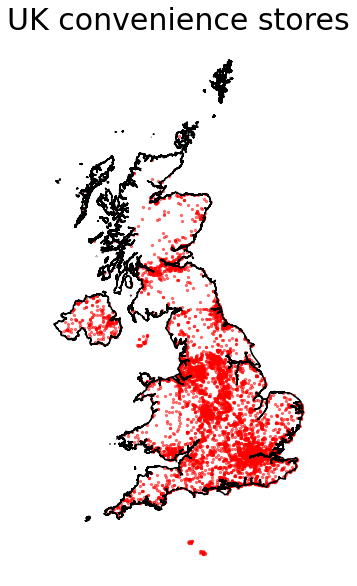

In [13]:
#create a base axis for the plot
fig, ax = plt.subplots(1,1, figsize = (10,10))

#plot the UK outline boundary
UK_outline.boundary.plot(ax=ax, edgecolor = "black")

#plot the convenience stores
convenience_stores_geo.plot(ax = ax, c = "red", markersize = 5, alpha = 0.5)

#set the axis off
ax.set_axis_off()

#add title
ax.set_title("UK convenience stores", fontsize = 30)

plt.show()

From this we can see that convenience stores are dotted all over the UK, with concentrations primarily in large urban cetres such as London, Birmingham and Manchester. 

We can make this interactive by:

In [14]:
#create a location list
locations = convenience_stores[["lat_wgs", "long_wgs"]]
location_list = locations.values.tolist()

#set the base map at the centre of the UK
convenience_map = folium.Map(location = [53.55, -2.43], zoom_start = 5)

#there will be many so it will be better to cluster than see all at once
marker_cluster = MarkerCluster().add_to(convenience_map)

#iteratre over each to add to the map
for point in range(0, len(location_list)):
    folium.Marker(location_list[point], popup = "Store Name: " + convenience_stores["store_name"][point],
                 icon = folium.Icon(color = "red", icon = "shopping-cart", prefix = "fa")).add_to(marker_cluster)

#show the map
convenience_map

Which you can move around to find more about the place you want to. For our interest though, and for initial inspect, we are going to examine a single region in the UK which is London. This is because of the large area that it covers and also the potential implications of work from home in the future. 

For this, we must subset the data so that we only have conveneince stores within London. We can do this by doing a point in polygon analysis to see which convenience stores locate within the boundary of greater London as follows:

C:\Users\phili\anaconda3\envs\urbansim\lib\site-packages\geopandas\geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


<AxesSubplot:>

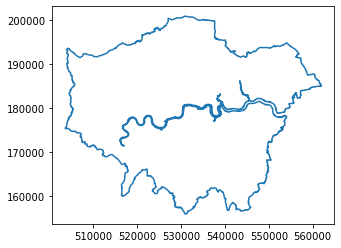

In [15]:
#read in Output areas outline from the UK geodata store
#read in the output area shapefile
#extracted from the UK geo portal: https://geoportal.statistics.gov.uk/
OA_outline = gpd.read_file("Data/OUtput_areas_boundaries/Output_Areas__December_2011__Boundaries_EW_BFC.shp")

#subset the output areas to those in London
#London is found using the E09 string with local authorities
London_OAs = OA_outline[OA_outline["LAD11CD"].str.contains("E09")]

#we then label these as the region of London
London_OAs["Region"] = "London"

#We can then extract the total London outline as we did for the UK
London_outline = London_OAs.dissolve(by = "Region")

#And plot the results to make sure it aligns with what we expect for London:
London_outline.boundary.plot()


In [16]:
#We can then merge the convenience stores dataset with the outline
#using a spatial join to find all convenience stores within the dtatset
London_convenience_stores = gpd.sjoin(convenience_stores_geo,
                                     London_outline,
                                     how = "inner",
                                     op = "within")

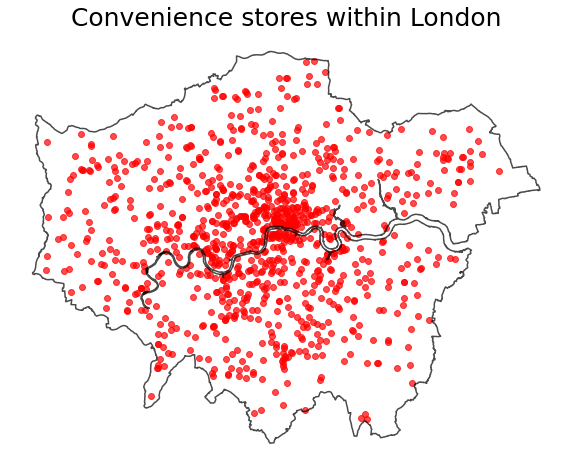

In [17]:
#We can then see how well this has worked by plotting conveneince stores and the London outline:
fig, ax = plt.subplots(1,1, figsize = (10,10))

London_outline.boundary.plot(ax = ax, color = "black", alpha = 0.7)

London_convenience_stores.plot(ax = ax, color = "red", alpha = 0.7)

ax.set_axis_off()

ax.set_title("Convenience stores within London", fontsize = 25)

plt.show()

In [18]:
#And again in interactive form

#create a location list
locations = London_convenience_stores[["lat_wgs", "long_wgs"]]
location_list = locations.values.tolist()

#set the base map at the centre of the UK
London_convenience_map = folium.Map(location = [51.50, -0.13], zoom_start = 10)

#there will be many so it will be better to cluster than see all at once
marker_cluster = MarkerCluster().add_to(London_convenience_map)

#iteratre over each to add to the map
for point in range(0, len(location_list)):
    folium.Marker(location_list[point], popup = "Store Name: " + convenience_stores["store_name"][point],
                 icon = folium.Icon(color = "red", icon = "shopping-cart", prefix = "fa")).add_to(marker_cluster)

style = {"fillOpacity":0, "lineColor":"Blue"}
    
folium.GeoJson(London_outline, name = "geojson",
              style_function = lambda x: style).add_to(London_convenience_map)
    
#show the map
London_convenience_map

Now that we have subsetted the data to that of convenience stores within London, what data does that leave us with?

In [19]:
#The number of stores that we have
print("There are", 
      len(London_convenience_stores), 
      "convenience stores from major grocery retailers within London.")

There are 997 convenience stores from major grocery retailers within London.


In [20]:
#the value counts
London_convenience_stores["retailer"].value_counts()

Tesco                                   380
Sainsburys                              261
The Co-operative Group                  181
Marks and Spencer                        82
Spar                                     43
Budgens                                  22
Waitrose                                 10
Morrisons                                 6
The Southern Co-operative                 4
Asda                                      3
Iceland                                   3
Whole Foods Market                        1
Chelmsford Star Co-operative Society      1
Name: retailer, dtype: int64

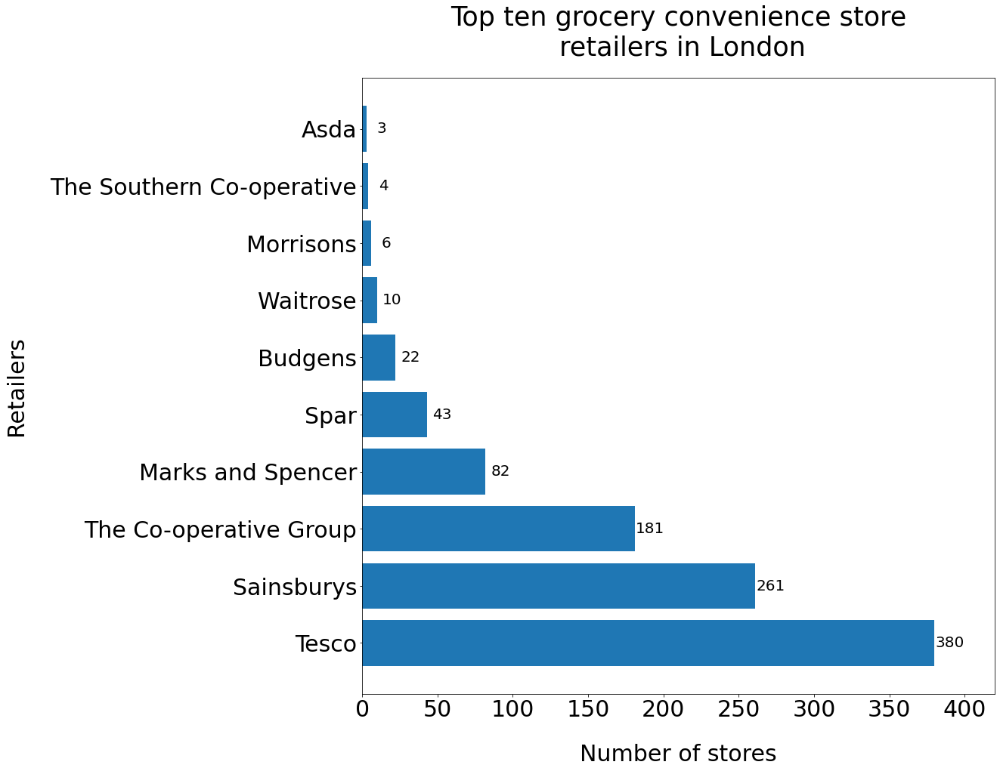

In [21]:
fig, ax = plt.subplots(1,1, figsize = (15,15))

#goupby the retail to get the count of the number of stores
London_convenience_retailers = London_convenience_stores.groupby(["retailer"],
                                                                as_index=False).size()
#order by the size
London_convenience_retailers.sort_values(by = ["size"], ascending=False, inplace=True)
#reset the index
London_convenience_retailers.reset_index(inplace=True)

#create a horizontal bar chart of the retailsers
ax.barh(London_convenience_retailers["retailer"].head(10),
      London_convenience_retailers["size"].head(10))

#set the titles and labels
ax.set_title("Top ten grocery convenience store\n retailers in London", fontsize = 35,
            pad = 30)
ax.set_xlabel("Number of stores", fontsize = 30, labelpad = 30)
ax.set_ylabel("Retailers", fontsize = 30, labelpad = 30)
#increase the tick size
ax.tick_params(axis = "both", labelsize = 30)
#expand the x axis for the annotations to be places
ax.set_xlim([0, 420])
#create annotations
for i in range(len(London_convenience_retailers["retailer"].head(10))):
    ax.annotate(str(London_convenience_retailers["size"][i]),
                 xy = (London_convenience_retailers["size"][i]+10, 
                      London_convenience_retailers["retailer"][i]),
                 ha = "center",
                 va = "center",
               fontsize = 20)
#save the figure
plt.savefig("Images/convenience_retailers.jpeg", dpi = 300, bbox_inches="tight")


Which we can see that a few retailers (Tesco, Sainsburys and Co-op) dominate the number of convenience grocery retailers within London. Of course, data is not extracted in terms of independent grocery retailers so many more could locate within this area, but for now the focus is primarily on large grocery retailers in London.

Now that we have London conveneince retailers, we can thus begin to extract information relating to each of these convenience retails. Going back to our initial data suggestions we thus need to link:

- The count of retail outlets surrounding convenience stores
- Residential population surrounding convenience stores
- Daytime population surrounding convenience stores
- proximity to railway stations
- Residential population by social class

To each of these convenience stores. At this point, it is assumed that travel to convenience retailers occurs on foot, and that as such the area surrounding each of these stores that matters is around 1km. Thus, we need to find the information for each of these convenience stores locations within 1km fo that store.

Firstly, we can focus on teh count of retail outlets surrounding convenience stores. We can access this using Open Street Map Data (OSM) which we can use to extract buildings classifications for buildings within a given radius. Given that we are focusing on the count of retail outlets surrounding convenience stores we can thus focus on buildings that have been classified as retail outlets:

In [22]:
#to reduce the need to call the osm api we can store the data after the first collection
Cleaned_convenience_surrounding_retail = os.path.join("Data", "stores_with_surrouding_retail.shp")

#if the data already exists, to reduce time waiting on the api call
#then we can read it in
if os.path.exists(Cleaned_convenience_surrounding_retail):
    #read in the cleaned results
    London_convenience_stores = gpd.read_file(Cleaned_convenience_surrounding_retail)
    
    #rename the column if read in 
    London_convenience_stores.rename(columns = {"stores_nea":"stores_nearby"}, inplace=True)
    
else:
    #set the tag of the building as retail usage
    tags = {"building":["retail"]}

    #create an empty list of retailers nearby
    retail_nearby = {}

    #iteratire over each row in the London_convenience_stores_dataset
    for index, row in London_convenience_stores.iterrows():
        
        #extract the buildings within a 1km radius
        buildings = ox.geometries_from_point((row["lat_wgs"], row["long_wgs"]), 
                                             tags, 
                                             dist = 1000)
        #add the number of buildings to the dictionary
        retail_nearby[row["store_name"]] = len(buildings)
    
    #set teh column to the number of stores nearby based on the dictionary results
    London_convenience_stores["stores_nearby"] = London_convenience_stores["store_name"].map(retail_nearby)
    
    #output the results to a csv file
    London_convenience_stores.to_file(Cleaned_convenience_surrounding_retail, index=False)

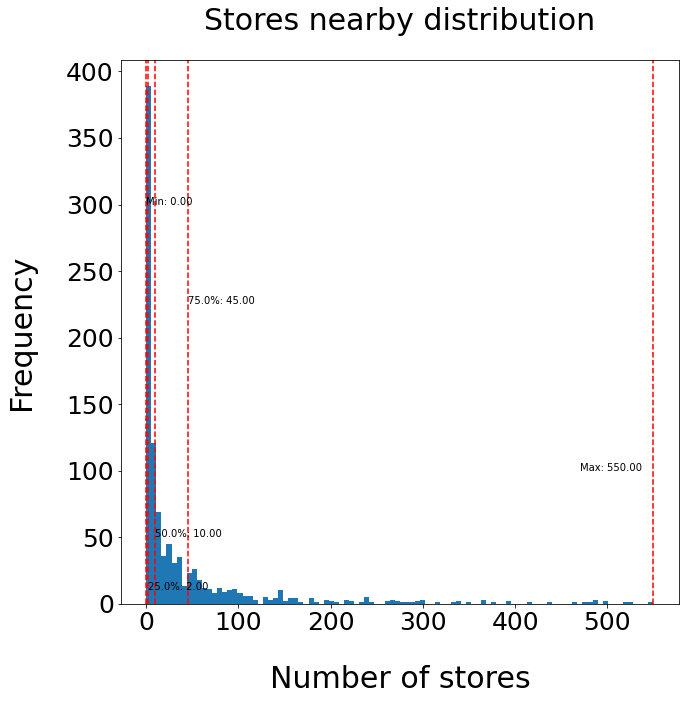

In [23]:
#create a base plot
fig, ax = plt.subplots(1,1, figsize = (10,10))

#create the histograme for the plot
ax.hist(x = London_convenience_stores["stores_nearby"], bins = 100)

#add anotations to the data so that we know what the distribution is like
quantiles = [0, 0.25, 0.5, 0.75, 1]

for quantile in quantiles:
    ax.axvline(x = London_convenience_stores.stores_nearby.quantile(q = quantile),
              color = "red", linestyle = "--")
    
    if quantile == 0:
        ax.text(x = London_convenience_stores.stores_nearby.quantile(q = quantile),
               y = 300, s = f"Min: {London_convenience_stores.stores_nearby.quantile(q = quantile):.2f}")
    elif quantile == 1:
        ax.text(x = London_convenience_stores.stores_nearby.quantile(q = quantile)-80,
               y = 100, s = f"Max: {London_convenience_stores.stores_nearby.quantile(q = quantile):.2f}")
    else:
        ax.text(x = London_convenience_stores.stores_nearby.quantile(q = quantile),
               y = London_convenience_stores.stores_nearby.quantile(q = quantile)*5, 
                s = f"{quantile*100}%: {London_convenience_stores.stores_nearby.quantile(q = quantile):.2f}")

#add label information        
ax.set_title("Stores nearby distribution", fontsize = 30, pad = 30)
ax.set_xlabel("Number of stores", fontsize = 30, labelpad = 30)
ax.set_ylabel("Frequency", fontsize = 30, labelpad = 30)
ax.tick_params(axis = "both", labelsize = 25)

From this we can see that the majority of convenience stores are not close to other convenience sores as 25% of stores have 2 or less other retail stores within a kilometre of themselves, however some stores have many close to them, in some cases this adds up to 550 retail stores within a kilometre of a convenience store. This suggests differences in positioning between convenience stores as some may be located near to residential locations meaning fewer retail stores close by but high residential population while others may locate near to retail clusters to catch pasisng foot traffic rather than residential demand. 

We can then examine the relation to transport as given by proximity to rail, tube and bus stations in the UK:

In [24]:
#read in the csv
stops = pd.read_csv("Data/stops.csv", encoding = "latin")
#set those to active stops
stops = stops[stops["Status"] == "act"]

C:\Users\phili\anaconda3\envs\urbansim\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (1,2,5,6,7,9,11,13,15,20,21,22,23,24,35,36) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [25]:
#we are interested in bus, train and underground stations so we extract those
stop_types = ["BCT", "BCS", "TMU", "MET", "PLT", "RSE",
             "RLY", "RPL", "BCE", "BST", "BCQ", "MKD"]
#extract stops that we are interested in
stops = stops[stops["StopType"].isin(stop_types)]

In [26]:
#subset the data to only information that we need
stops = stops[["ATCOCode", "CommonName", "Street", 
              "Town", "Longitude", "Latitude", "StopType",
              "Status"]]

In [27]:
#examine a sample of the data
stops.sample(20)

,ATCOCode,CommonName,Street,Town,Longitude,Latitude,StopType,Status
263367,390060652,Museum,Market Hill,NaN,1.313337,52.094250,BCT,act
268826,40004408815F,Froggetts Lane,Froggetts Lane,Walliswood,-0.407762,51.132862,BCT,act
1914,0170SGY43145,Woodside Farm,Abson Road,NaN,-2.426303,51.466112,BCT,act
109423,1800WA33531,Pike View Cottage,DICCONSON LANE,NaN,-2.556453,53.564861,BCT,act
106387,1800WK04101,Scot Lane,ORMSKIRK Road,NaN,-2.652590,53.539728,BCT,act
265669,390030345,Thistle Close,Primrose Hill,NaN,1.131119,52.049301,BCT,act
55105,1000DDHR7353,Eastfield Road,Hallowes Rise,NaN,-1.459357,53.295322,BCT,act
23924,0500HPIDL002,Warboys Road,High Street,NaN,-0.041944,52.381580,BCT,act
37937,0800COA10369,War Memorial,NaN,NaN,-4.612393,50.482548,BCT,act
48903,090033155196,Irvings of Dalston,Lingyclose Road,Dalston,-2.986615,54.866190,BCT,act


In [28]:
#convert the stops data into a geo dataframe
stops_geo = gpd.GeoDataFrame(stops,
                            geometry = gpd.points_from_xy(stops["Longitude"],
                                                         stops["Latitude"]))
#convert to BNG to match the projection that we have for the store
stops_geo.set_crs("EPSG:4326", inplace=True)
stops_geo.to_crs("EPSG:27700", inplace=True)

In [29]:
#create a buffer around each of the stores
London_convenience_buffer = London_convenience_stores.buffer(1000)
#drop the existing geometry
London_convenience_stores_buffer = London_convenience_stores.drop(columns = ["geometry"])
#replace this with the buffer gemoetry
London_convenience_stores_buffer["geometry"] = London_convenience_buffer
#the dataset is premerged so we need to remove the index right column to be able to do 
#a spatial join
London_convenience_stores_buffer.drop(columns = ["index_righ"], inplace=True)

#profmr teh spatial join to find the number of stations within a 1km buffer of the original store
London_convenience_stores_transport = gpd.sjoin(stops_geo,
                                                London_convenience_stores_buffer,
                                                how = "inner",
                                                op = "within")

#we then want the number of stops which can be found using the size attribute
London_convenience_stores_transport = (London_convenience_stores_transport.groupby(["store_name"], 
                                                                                   as_index=False)
                                       .size())
#renamethe size column
London_convenience_stores_transport.rename(columns = {"size":"transport_nearby"}, inplace=True)

In [30]:
#Once we have this information we can then merge this back together
London_convenience_stores = London_convenience_stores.merge(London_convenience_stores_transport,
                                                           on = "store_name",
                                                           how = "left")

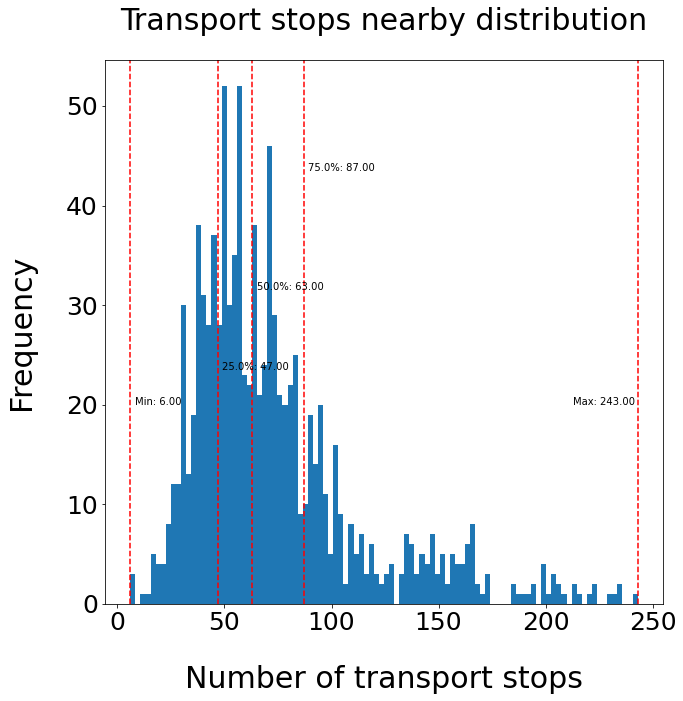

In [31]:
#again we can visualise the results:
fig, ax = plt.subplots(1,1, figsize = (10,10))

ax.hist(x = London_convenience_stores["transport_nearby"], bins = 100)

quantiles = [0, 0.25, 0.5, 0.75, 1]

for quantile in quantiles:
    ax.axvline(x = London_convenience_stores.transport_nearby.quantile(q = quantile),
              color = "red", linestyle = "--")
    
    if quantile == 0:
        ax.text(x = London_convenience_stores.transport_nearby.quantile(q = quantile) + 2,
               y = 20, s = f"Min: {London_convenience_stores.transport_nearby.quantile(q = quantile):.2f}")
    elif quantile == 1:
        ax.text(x = London_convenience_stores.transport_nearby.quantile(q = quantile)-30,
               y = 20, s = f"Max: {London_convenience_stores.transport_nearby.quantile(q = quantile):.2f}")
    else:
        ax.text(x = London_convenience_stores.transport_nearby.quantile(q = quantile) + 2,
               y = 0.5*London_convenience_stores.transport_nearby.quantile(q = quantile), 
                s = f"{quantile*100}%: {London_convenience_stores.transport_nearby.quantile(q = quantile):.2f}")

#add label information
ax.set_title("Transport stops nearby distribution", fontsize = 30, pad = 30)
ax.set_xlabel("Number of transport stops", fontsize = 30, labelpad = 30)
ax.set_ylabel("Frequency", fontsize = 30, labelpad = 30)
ax.tick_params(axis = "both", labelsize = 25)

The next thing to therefore examine is that of workplace population. again, assuming 1km buffer, we can calculate the daytime population within walking distace of each of the convenience stores:

In [32]:
#read in the workplace zone boundaries shapefile as a geopandas file
UK_WZ = gpd.read_file("Data/workplace_zone_boundary/Workplace_Zones_(December_2011)_Boundaries.shp")

#read in the population numbers file
UK_WZ_pop = pd.read_csv("Data/AGE_DAYPOP_ECOACT_WKPZ_England_Wales_Descriptions.csv")
#rename the column so that it is easier to use in the future
UK_WZ_pop.rename(columns = {"Age : Age 16 to 74 - Economic activity : Total\ Economic activity - Population (daytime/workday) [E][N][W] : Workplace population - Unit : Persons":"workplace_population"},
                inplace = True)

In [33]:
#we want to find the area of overlap between buffers and the workplace zone
#this is so that we can calculate the percentage of population later
WZ_overlap = gpd.overlay(London_convenience_stores_buffer[["store_name", "geometry"]], 
                         UK_WZ[["wz11cd", "geometry"]], how = "intersection")

In [34]:
#calcualte the area of the workplace zone
UK_WZ["area"] = UK_WZ.area
#claculate the area of teh overlapped area
WZ_overlap["overlap_area"] = WZ_overlap.area

In [35]:
#merge the overlap with the workplace zone 
WZ_overlap = WZ_overlap.merge(UK_WZ,
                             on = "wz11cd",
                             how = "left")
#calculate the area for each workplace zone that lies within the overlap
#this is so we can get a percentage of population
WZ_overlap["area_perc"] = WZ_overlap["overlap_area"]/WZ_overlap["area"]

#merge the resulting data with that of the population datadrame
WZ_overlap = WZ_overlap.merge(UK_WZ_pop[["GEO_CODE", "workplace_population"]],
                             left_on = "wz11cd",
                             right_on = "GEO_CODE",
                             how = "left")

#calcualte the actual amount of workplace population within the immediate zone
#this assumes that workplace population is evenly distributed within a workplace zone
WZ_overlap["WZ_area_pop"] = WZ_overlap["area_perc"] * WZ_overlap["workplace_population"]

#we then want this by each store so we groupby the store name
Workzone_pop = WZ_overlap.groupby(["store_name"], as_index=False).agg({"WZ_area_pop":"sum"})

In [36]:
#merge the resulting data with the conveience stores data 
London_convenience_stores = London_convenience_stores.merge(Workzone_pop,
                                                           on = "store_name",
                                                           how= "left")

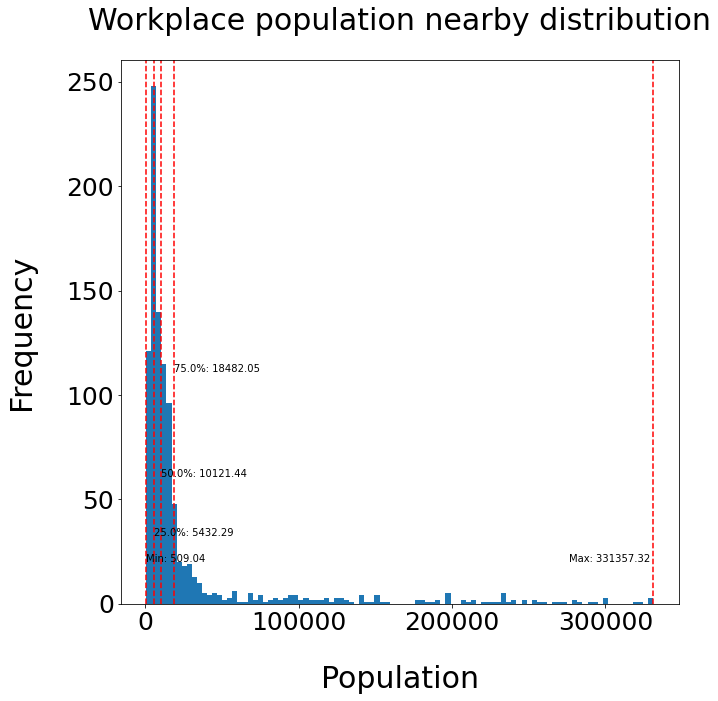

In [37]:
#We can visualise the results from the workplace zone
fig, ax = plt.subplots(1,1, figsize = (10,10))

ax.hist(x = London_convenience_stores["WZ_area_pop"], bins = 100)

quantiles = [0, 0.25, 0.5, 0.75, 1]

for quantile in quantiles:
    ax.axvline(x = London_convenience_stores.WZ_area_pop.quantile(q = quantile),
              color = "red", linestyle = "--")
    
    if quantile == 0:
        ax.text(x = London_convenience_stores.WZ_area_pop.quantile(q = quantile) + 200,
               y = 20, s = f"Min: {London_convenience_stores.WZ_area_pop.quantile(q = quantile):.2f}")
    elif quantile == 1:
        ax.text(x = London_convenience_stores.WZ_area_pop.quantile(q = quantile)-55000,
               y = 20, s = f"Max: {London_convenience_stores.WZ_area_pop.quantile(q = quantile):.2f}")
    else:
        ax.text(x = London_convenience_stores.WZ_area_pop.quantile(q = quantile) + 200,
               y = 0.006*London_convenience_stores.WZ_area_pop.quantile(q = quantile), 
                s = f"{quantile*100}%: {London_convenience_stores.WZ_area_pop.quantile(q = quantile):.2f}")
    
#add label information
ax.set_title("Workplace population nearby distribution", fontsize = 30, pad = 30)
ax.set_xlabel("Population", fontsize = 30, labelpad = 30)
ax.set_ylabel("Frequency", fontsize = 30, labelpad = 30)
ax.tick_params(axis = "both", labelsize = 25)

From this we can see that conveience stores have at least 500 workers working in a 1km buffer around the store during the day, but that this can vary significnatly between stores, with a maximum of 331,357 workers working within a 1km zone around the store. This skewed distribution is likely to be because of the significnat concentration of jobs within London such as the large concentration of jobs within the city of London and Canary Wharf where a 1km distance is likely to cover many office blocks. Thus, this distribution is as expected.

Last but not least we can extract the residential population and its associated information, including the number of residents within a 1km buffer and the percentage of that population working within social class 1 jobs:

In [38]:
#read in the output area shapefile
#extracted from the UK geo portal: https://geoportal.statistics.gov.uk/
OA_outline = gpd.read_file("Data/OUtput_areas_boundaries/Output_Areas__December_2011__Boundaries_EW_BFC.shp")

#read in the population data for each output area
#dataset precleaned by creating csv and removing headings
OA_population = pd.read_csv("Data/OA_population_2011.csv")


In [39]:
#clean the population data so that it can be used
#we replace the , with nothing
OA_population["All usual residents"] = OA_population["All usual residents"].str.replace(",", "")
#so that the data can be converted to floats
OA_population["All usual residents"] = OA_population["All usual residents"].astype(float)

In [40]:
#Get the outlines including the population
OA_outline = OA_outline[["OA11CD", "Shape__Are", "geometry"]].merge(OA_population[["OA Code", "All usual residents"]],
                            left_on = "OA11CD",
                            right_on = "OA Code",
                            how = "inner")

In [41]:
#https://www.nomisweb.co.uk/census/2011/ks611ew

#read in the output area population distribution of people working within a given job classification
#data precleaned removing headings and setting to csv
London_SeC = pd.read_csv("Data/OA_SeC.csv")
#rename the columns so they are easier to work with
London_SeC.rename(columns = {"Sex: All persons; NS-SeC: 1. Higher managerial, administrative and professional occupations; measures: Value":
                            "social_class_1",
                            "Sex: All persons; NS-SeC: All categories: NS-SeC; measures: Value":
                            "working_pop"}, inplace=True)
#merge this with the outline data
OA_outline = OA_outline.merge(London_SeC[["geography",
                                         "social_class_1",
                                         "working_pop"]],
                             left_on = "OA11CD",
                             right_on = "geography",
                             how = "left")

In [42]:
#perform the overal analysis to get overlap between buffer and output area boundaries
pop_overlap = gpd.overlay(London_convenience_stores_buffer[["store_name", "geometry"]], 
                         OA_outline[["OA11CD", "geometry", "Shape__Are",
                                    "social_class_1", "All usual residents",
                                    "working_pop"]], how = "intersection")
#clauclate the area for the overlap
pop_overlap["area"] = pop_overlap.area
#calculate the percentage area of overlap
pop_overlap["perc_area"] = pop_overlap["area"]/pop_overlap["Shape__Are"]

#claculate the population statistics on the basis of this population overlap
pop_overlap["residential_pop"] = pop_overlap["perc_area"] * pop_overlap["All usual residents"]
pop_overlap["class_1_pop"] = pop_overlap["perc_area"] * pop_overlap["social_class_1"]
pop_overlap["working_pop"] = pop_overlap["perc_area"] * pop_overlap["working_pop"]

#groupby the store name to get total data
pop_overlap = (pop_overlap.groupby(["store_name"], as_index=False)
               .agg({"class_1_pop":"sum",
                    "residential_pop":"sum",
                    "working_pop":"sum"}))

#get the percentage of population in class 1
pop_overlap["class_1_pop"] = (pop_overlap["class_1_pop"]/pop_overlap["working_pop"])*100

In [43]:
#merge this back with the original data
London_convenience_stores = London_convenience_stores.merge(pop_overlap,
                                                           on = "store_name",
                                                           how = "left")

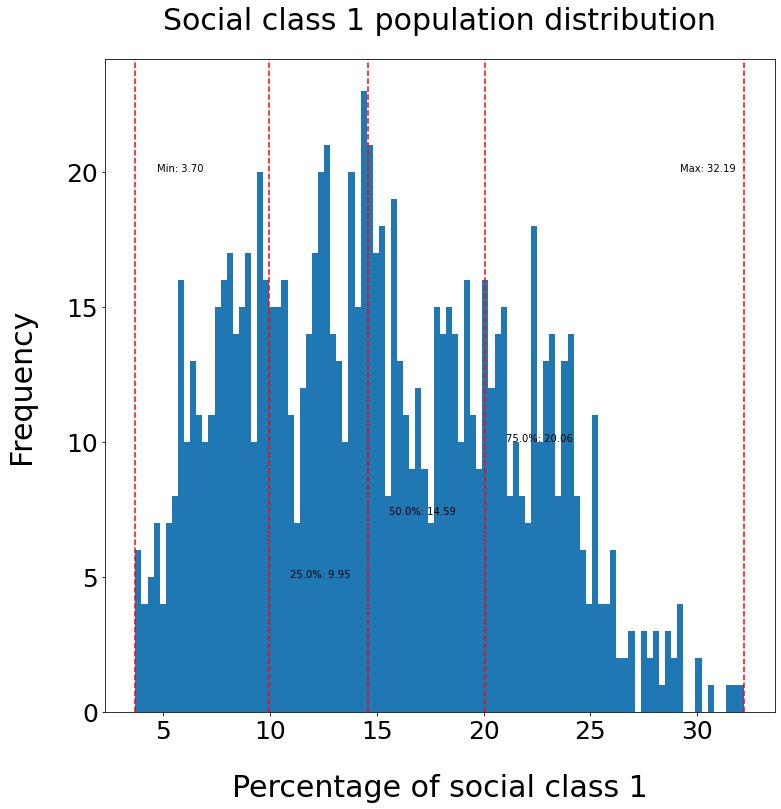

In [44]:
#again we can visualise the results:
fig, ax = plt.subplots(1,1, figsize = (12,12))

column = "class_1_pop"

ax.hist(x = London_convenience_stores[column], bins = 100)

quantiles = [0, 0.25, 0.5, 0.75, 1]

for quantile in quantiles:
    ax.axvline(x = London_convenience_stores[column].quantile(q = quantile),
              color = "red", linestyle = "--")
    
    if quantile == 0:
        ax.text(x = London_convenience_stores[column].quantile(q = quantile) + 1,
               y = 20, s = f"Min: {London_convenience_stores[column].quantile(q = quantile):.2f}")
    elif quantile == 1:
        ax.text(x = London_convenience_stores[column].quantile(q = quantile)-3,
               y = 20, s = f"Max: {London_convenience_stores[column].quantile(q = quantile):.2f}")
    else:
        ax.text(x = London_convenience_stores[column].quantile(q = quantile) + 1,
               y = 0.5*London_convenience_stores[column].quantile(q = quantile), 
                s = f"{quantile*100}%: {London_convenience_stores[column].quantile(q = quantile):.2f}")
        
#add label information
ax.set_title("Social class 1 population distribution", fontsize = 30, pad = 30)
ax.set_xlabel("Percentage of social class 1", fontsize = 30, labelpad = 30)
ax.set_ylabel("Frequency", fontsize = 30, labelpad = 30)
ax.tick_params(axis = "both", labelsize = 25)

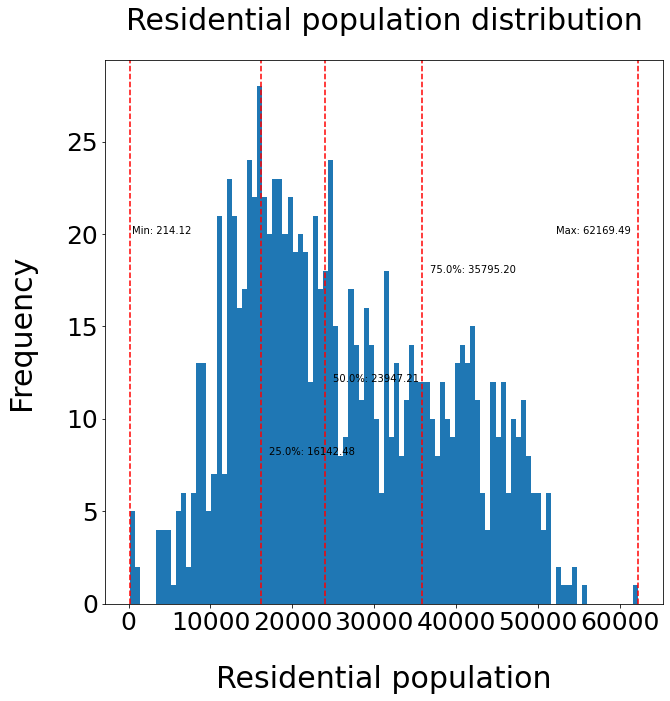

In [45]:
fig, ax = plt.subplots(1,1, figsize = (10,10))

column = "residential_pop"

ax.hist(x = London_convenience_stores[column], bins = 100)

quantiles = [0, 0.25, 0.5, 0.75, 1]

for quantile in quantiles:
    ax.axvline(x = London_convenience_stores[column].quantile(q = quantile),
              color = "red", linestyle = "--")
    
    if quantile == 0:
        ax.text(x = London_convenience_stores[column].quantile(q = quantile) + 200,
               y = 20, s = f"Min: {London_convenience_stores[column].quantile(q = quantile):.2f}")
    elif quantile == 1:
        ax.text(x = London_convenience_stores[column].quantile(q = quantile)-10000,
               y = 20, s = f"Max: {London_convenience_stores[column].quantile(q = quantile):.2f}")
    else:
        ax.text(x = London_convenience_stores[column].quantile(q = quantile) + 1000,
               y = 0.0005*London_convenience_stores[column].quantile(q = quantile), 
                s = f"{quantile*100}%: {London_convenience_stores[column].quantile(q = quantile):.2f}")
        
#add label information
ax.set_title("Residential population distribution", fontsize = 30, pad = 30)
ax.set_xlabel("Residential population", fontsize = 30, labelpad = 30)
ax.set_ylabel("Frequency", fontsize = 30, labelpad = 30)
ax.tick_params(axis = "both", labelsize = 25)

Now that we have all the data together we can start to prepare it for the k-means clustering algorithm. The first thing to note here is that from all the different plots that we have seen they all have slightly different distrubitions, ranges and units. Thus we need to be standardise the data to prepare it as the kmeans algorithm is sensitive to different variations in the data and may allow the data to focus on a single variable that has high variation.

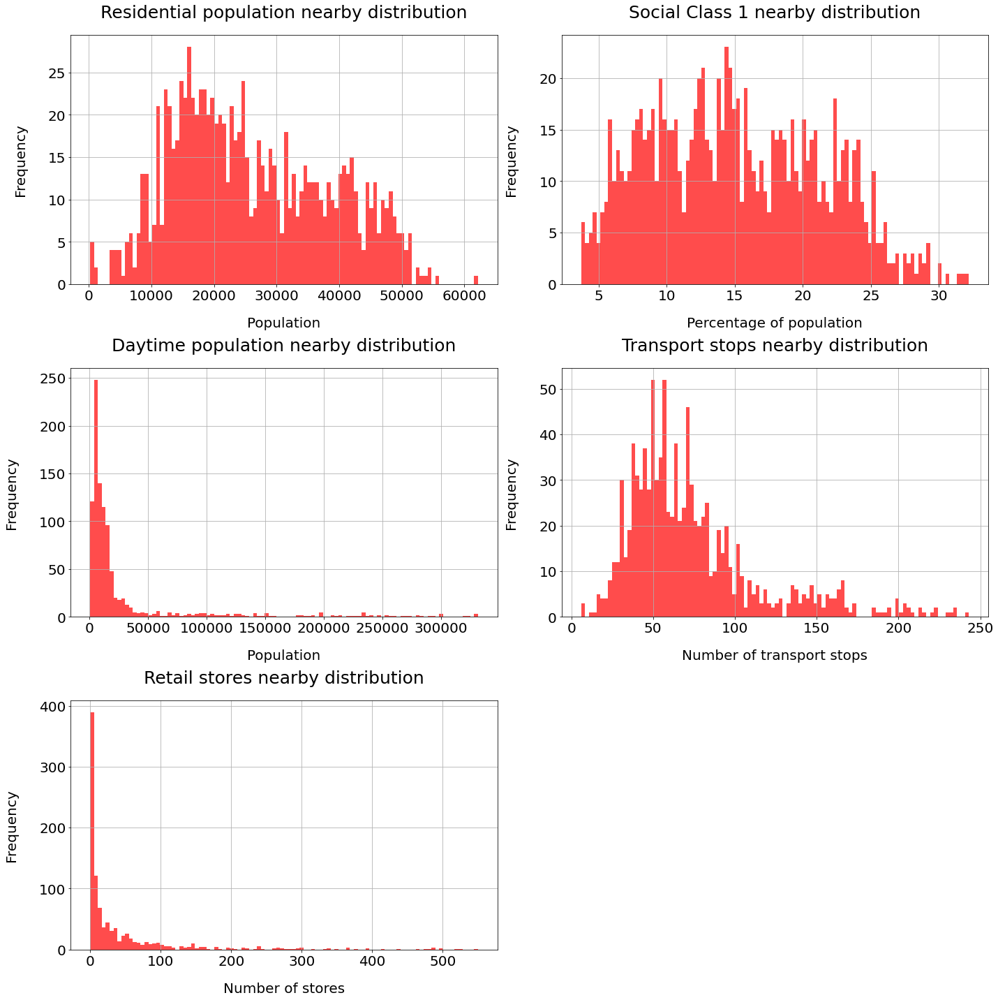

In [46]:
#set the columns we are interested in
columns = ["residential_pop", 
            "class_1_pop",
            "WZ_area_pop",
            "transport_nearby",
            "stores_nearby"]
#set the histogram titles
hist_titles = ["Residential population nearby distribution",
              "Social Class 1 nearby distribution",
              "Daytime population nearby distribution",
              "Transport stops nearby distribution",
              "Retail stores nearby distribution"]
#set the acis labels
axis_labels = ["Population", 
              "Percentage of population",
              "Population",
              "Number of transport stops",
              "Number of stores"]

#create a base axis for teh plots
fig, ax = plt.subplots(3,2, figsize = (20,20))
#flatten the axis to make it easy to iteratre over
axis = ax.flatten()

#iterate over each columns using the labels information already set up
for i, col in enumerate(columns):
    
    #create the histogram using the column
    London_convenience_stores[col].hist(bins = 100, ax = axis[i],
                                       color = "red",
                                       alpha = 0.7)
    #add label information
    axis[i].set_title(hist_titles[i], fontsize = 25, pad = 25)
    axis[i].set_ylabel("Frequency", fontsize  =20, labelpad = 30)
    axis[i].set_xlabel(f"{axis_labels[i]}", fontsize = 20, labelpad = 20)
    axis[i].tick_params(axis = "both", labelsize = 20)

#remove the unused axis
axis[5].set_axis_off()
#keep the layout tight
plt.tight_layout()
#show the plot 
plt.show()

We want to log transform the data to ensure that there is a more normal distribution then scale the data which can then be scaled before performing the cluster analysis.

In [47]:
#understand the data distribution to see if tehre will be any issues in trasnformation
London_convenience_stores[["residential_pop", 
                            "class_1_pop",
                            "WZ_area_pop",
                            "transport_nearby",
                            "stores_nearby"]].describe()

,residential_pop,class_1_pop,WZ_area_pop,transport_nearby,stores_nearby
count,997.000000,997.000000,997.000000,997.000000,997.000000
mean,26071.210934,15.097149,30121.558033,73.462387,43.041123
std,12365.566244,6.199306,57284.082592,40.481488,81.752438
min,214.115750,3.699248,509.041464,6.000000,0.000000
25%,16142.481285,9.948477,5432.286653,47.000000,2.000000
50%,23947.206728,14.591609,10121.444254,63.000000,10.000000
75%,35795.200538,20.056803,18482.048663,87.000000,45.000000
max,62169.485840,32.193807,331357.322734,243.000000,550.000000


In [48]:
#iteratre over the columns
for col in columns:
    #create a new log column and convert the data
    London_convenience_stores[col + "_log"] = np.log10(London_convenience_stores[col])
    #some issues are encountered so convert these to 0 values 
    London_convenience_stores[col + "_log"] = London_convenience_stores[col + "_log"].replace([np.inf, -np.inf], 0)


C:\Users\phili\anaconda3\envs\urbansim\lib\site-packages\pandas\core\series.py:726: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [49]:
#import preprocessing
import sklearn.preprocessing as preprocessing
#scale the data accordingly
scaled = preprocessing.scale(London_convenience_stores[["residential_pop_log", 
                                                        "class_1_pop_log",
                                                        "WZ_area_pop_log",
                                                        "transport_nearby_log",
                                                        "stores_nearby_log"]])
#create a dataframe from the data
log_then_normal = pd.DataFrame(scaled)

#set the columns 
log_columns = ["residential_pop_log", "class_1_pop_log", "WZ_area_pop_log", "transport_nearby_log", "stores_nearby_log"]

log_then_normal.columns = log_columns

#add this to a scaled dataset to be used in modelling
London_convenience_stores_scaled = pd.concat([London_convenience_stores.drop(log_columns, axis = 1), 
                                              log_then_normal], 
                                             axis = 1)

For KMeans clustering, the number of clusters has to be specified before implementation. This makes it difficult when the number of clustrs is not known in advance. Two main methods for deciding this are the Elbow plot, which is used by finding where the rate of SSE decline starts to flatten out, and the Silhouette plot where the maximum Silhouette value can be found. Of course, there are issues with both methods and clustering is an unsupervised machine learning methods so interpretability of the results plays an important part. 

In [50]:
#import the necessary libraries
from sklearn import metrics
from sklearn.cluster import KMeans

#create an empty list
list_SSE = []
#set ther ange of clusters to evaluate
min_k = 1
max_k = 10
range_k = range(min_k, max_k)

#iterate over the range
for i in range_k:
    #perform the clustering algorithm
    km = KMeans(n_clusters = i,
               init = "random",
               n_init = 10,
               max_iter = 300,
               tol = 1e-04, 
                random_state = 22)
    #fit this to the data
    km.fit(London_convenience_stores_scaled[log_columns])
    #add the SEE score
    list_SSE.append(km.inertia_)    

C:\Users\phili\anaconda3\envs\urbansim\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


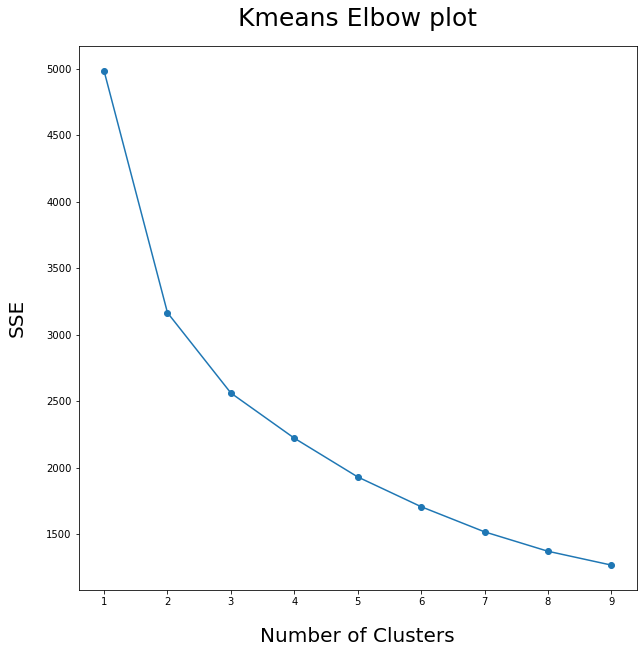

In [51]:
#create the base plots
fig, ax = plt.subplots(1,1, figsize = (10,10))

#add the data to the axis
ax.plot(range_k, list_SSE, marker = "o")

#add the necessary labels
ax.set_xlabel("Number of Clusters", fontsize = 20, labelpad = 20)
ax.set_ylabel("SSE", fontsize =20, labelpad = 20)
ax.set_title("Kmeans Elbow plot", fontsize = 25, pad = 20)

plt.show()

In [52]:
#for the silhouette score
import random

#create an empty list
silhouette = []

#iteratre over the number of clusters to evaluate
for i in range(2,10):
    
    #create an empty list to hold the averages
    average = []
    #perform the clustering algorithm several times for each number of clusters
    for x in range(1,10):
        #set the number of clusters
        k_cluster = i
        #generate a arandom seed number
        random_seed = random.randint(1,101)
        #apply the KMeans clustering algorithm
        kmeans_method = KMeans(n_clusters = k_cluster,
                              random_state = random_seed)
        kmeans_method.fit(London_convenience_stores_scaled[log_columns])
        #extract the labels
        labels = kmeans_method.labels_
        #extract the silhouette score
        a = metrics.silhouette_score(London_convenience_stores_scaled[log_columns], labels)
        #append the result
        average.append(a)
    #clauclate the average silhouette score for each number of clusters 
    silhouette.append(sum(average)/len(average))

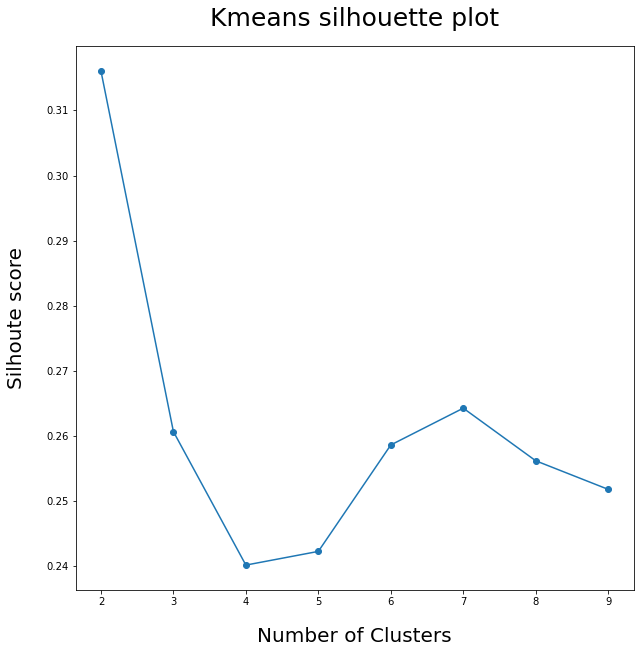

In [53]:
#create a base axis
fig, ax = plt.subplots(1,1, figsize = (10,10))

#plot the results
ax.plot(range(2,10), silhouette, marker = "o")

#add the lbels
ax.set_xlabel("Number of Clusters", fontsize = 20, labelpad = 20)
ax.set_ylabel("Silhoute score", fontsize =20, labelpad = 20)
ax.set_title("Kmeans silhouette plot", fontsize = 25, pad = 20)

plt.show()

Text(0.5, 1.0, 'Kmeans Elbow plot')

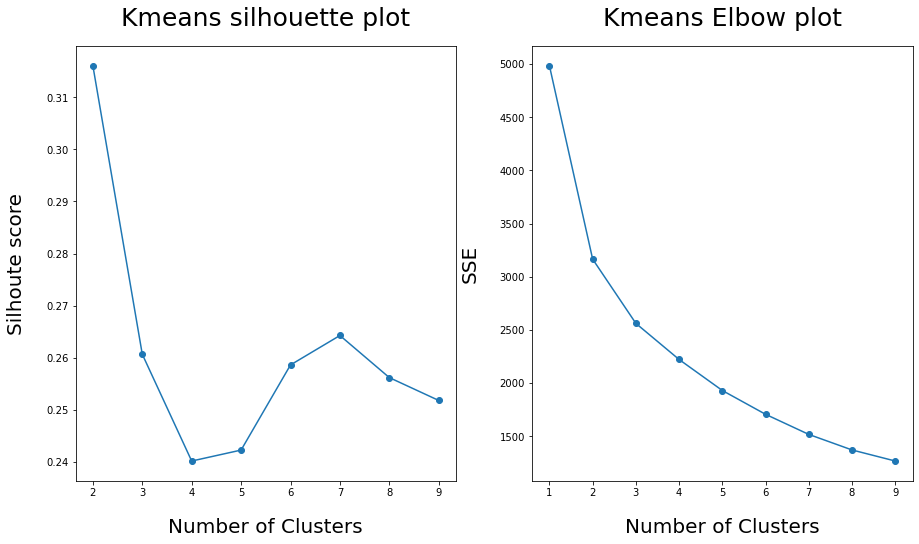

In [54]:
#combine both plots
fig, ax = plt.subplots(1,2, figsize = (15,8))

ax[0].plot(range(2,10), silhouette, marker = "o")
ax[0].set_xlabel("Number of Clusters", fontsize = 20, labelpad = 20)
ax[0].set_ylabel("Silhoute score", fontsize =20, labelpad = 20)
ax[0].set_title("Kmeans silhouette plot", fontsize = 25, pad = 20)

ax[1].plot(range_k, list_SSE, marker = "o")
ax[1].set_xlabel("Number of Clusters", fontsize = 20, labelpad = 20)
ax[1].set_ylabel("SSE", fontsize =20, labelpad = 20)
ax[1].set_title("Kmeans Elbow plot", fontsize = 25, pad = 20)


These results suggest that either two three or seven clusters should be the optimal number of clusters for this. This is because the elbow plot appears to suggest two or three, while the silhouette plot suggests either two or seven clusters. Thus, these can be evaluted in terms of the interpretability of their location, the interretability of the cluster means and the distribution of the number of stores within each classification:

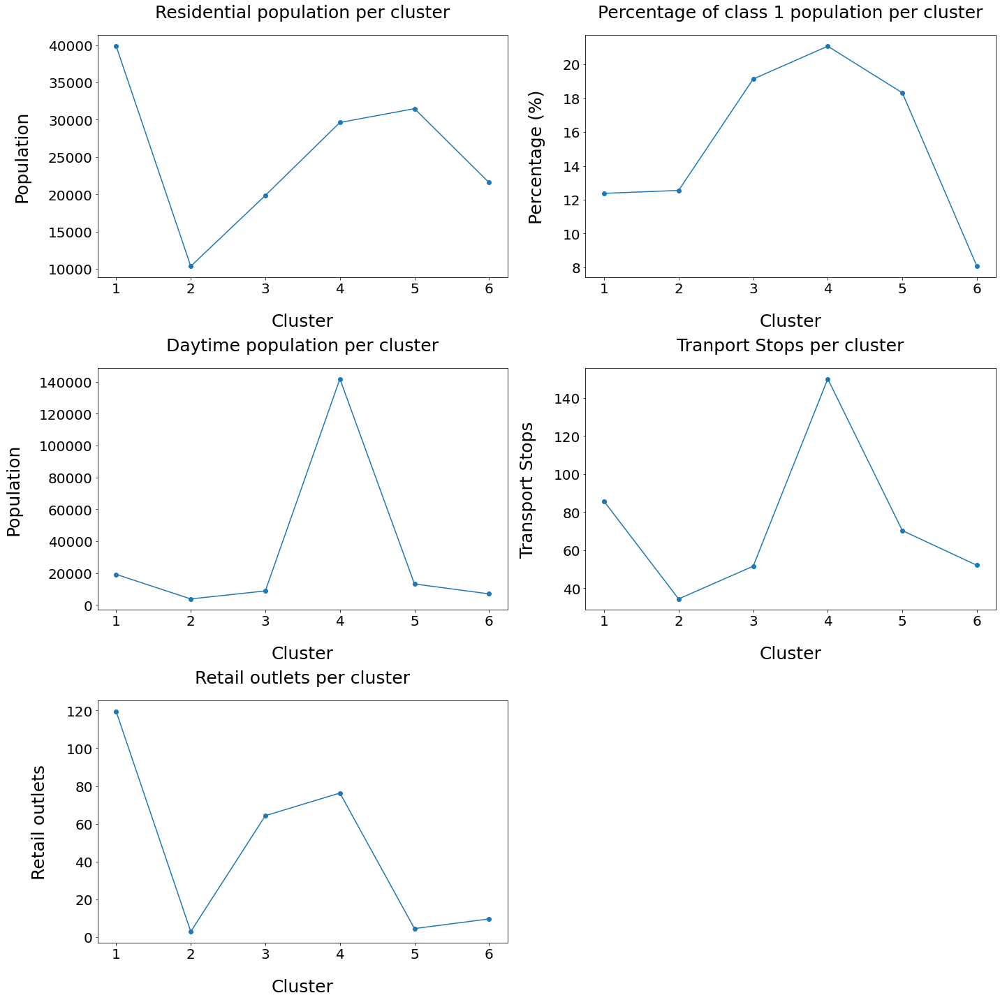

In [55]:
#perform the clustering with the chosen number of clusters
kmeans_method = KMeans(n_clusters = 6,
                        random_state = 22,
                      n_init = 10)
kmeans_method.fit(London_convenience_stores_scaled[log_columns])


#creating plots for the results to understand the means

#set the titles
titles = ["Residential population per cluster", 
         "Percentage of class 1 population per cluster",
         "Daytime population per cluster",
         "Tranport Stops per cluster",
         "Retail outlets per cluster"]
#set the labels
ylabels = ["Population",
          "Percentage (%)",
          "Population",
          "Transport Stops",
          "Retail outlets"]
#extract the cluster labels and add these back to teh data
labels = kmeans_method.labels_
London_convenience_stores["labels"] = labels
London_convenience_stores["labels"] = London_convenience_stores["labels"] + 1

#create a base plot
fig, ax = plt.subplots(3,2, figsize = (20,20))
#flatten the axis
axis = ax.flatten()

#iterate over each column to create plots for each 
for i, col in enumerate(columns):
    #create an empty dictionary
    col_dict = {}
    #iterate over each label
    for label in list(London_convenience_stores["labels"].unique()):
        #crete a new dataframe for each label
        label_df = London_convenience_stores[London_convenience_stores["labels"] == label]
        #add the mean to the dataframe
        col_dict[label] = label_df[col].mean()
    #convert the dictionary to a dataframe
    column_df = pd.DataFrame.from_dict(col_dict, orient = "index")
    #reset the index
    column_df.reset_index(inplace=True)
    #sort the values by the index
    column_df.sort_values(by = "index", inplace=True)
    
    #plot the results
    axis[i].plot(column_df["index"], column_df[0],
                marker = "o")
    
    #set the plots up
    axis[i].set_title(titles[i], fontsize = 25, pad = 25)
    axis[i].set_xlabel("Cluster", fontsize = 25, labelpad = 25)
    axis[i].set_ylabel(ylabels[i], fontsize =25, labelpad = 25)
    axis[i].tick_params(axis = "both", labelsize = 20)

#remove the unused axis
axis[5].set_axis_off()

#set the layout to tight so no overalp
plt.tight_layout()
    

In [56]:
#extract the number of stores within each 
London_convenience_stores["labels"].value_counts()

5    213
6    200
1    158
4    148
3    148
2    130
Name: labels, dtype: int64

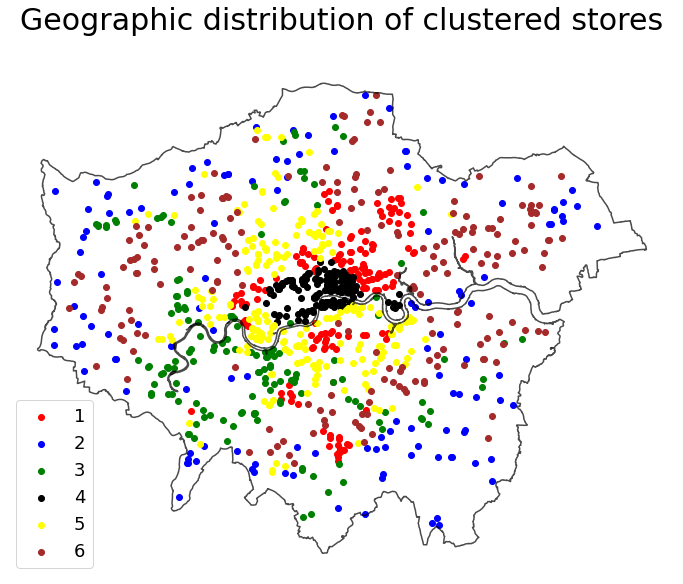

In [57]:

#plot the geographic representation of the results

#create the base axis
fig, ax = plt.subplots(1,1, figsize = (12,12))
#plot the London boundary so we see where they are
London_outline.boundary.plot(ax = ax, color = "black", alpha = 0.7)
#get colors for each potential clsuter
colors = ["red", "blue", "green", "black", "yellow", "brown", "orange", "brown"]

#iterate over each cluster label
for i, label in enumerate(sorted(list(London_convenience_stores["labels"].unique()))):
    #create a dataframe for each cluster
    df = London_convenience_stores[London_convenience_stores["labels"] == label]
    #plot the result
    df.plot(ax=ax, color = colors[i], label = label)
    
#remove the axis
ax.set_axis_off()    
#set the title
ax.set_title("Geographic distribution of clustered stores", fontsize = 30,
            pad = 30)
#add the legend 
plt.legend(fontsize = 18)
    

In [58]:
#we can make this a bit better looking using a basemap
import contextily as ctx

In [59]:
#convert the datasets to the EPSG 3857 for web pojections to use with the base map
London_outline_web = London_outline.to_crs(epsg = 3857)
London_convenience_stores_web = London_convenience_stores.to_crs(epsg = 3857)

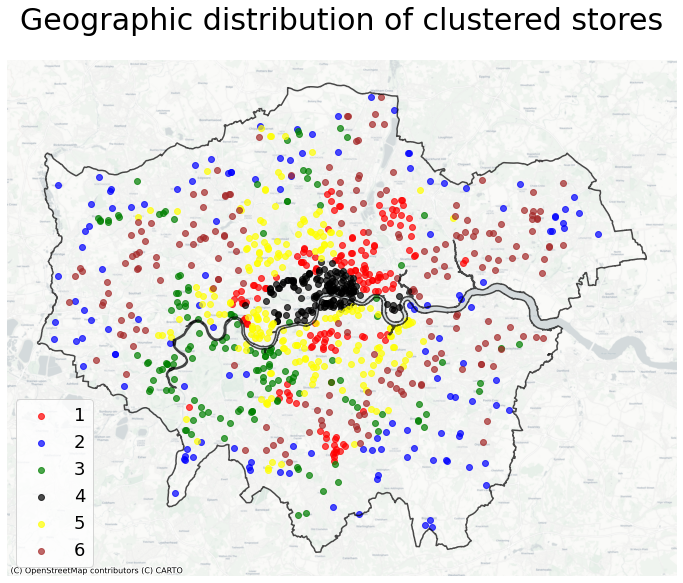

In [60]:
#repeate the previous plot
fig, ax = plt.subplots(1,1, figsize = (12,12))

London_outline_web.boundary.plot(ax = ax, color = "black", alpha = 0.7)

colors = ["red", "blue", "green", "black", "yellow", "brown", "orange", "brown"]

for i, label in enumerate(sorted(list(London_convenience_stores_web["labels"].unique()))):
    
    df = London_convenience_stores_web[London_convenience_stores_web["labels"] == label]
    
    df.plot(ax=ax, color = colors[i], label = label,
           alpha = 0.7)
    

ax.set_axis_off()  

ax.set_title("Geographic distribution of clustered stores", fontsize = 30,
            pad = 30)
#add the basemap
ctx.add_basemap(ax, zoom = 12,
               source = ctx.providers.CartoDB.Positron)
    
plt.legend(fontsize = 18)

After evaluating the results it was suggested that six clusters would be the most appropriate for this dataset. These can be interpreted as:

### Cluster 1 - Residential and retail focused

The location of these clusters appear around main population centres and are located near to other retail locations. Found in and around the centre of London these are likely to be found near to major high streets that also have large residential population. 

### Cluster 2 - Distributed convenience stores

These convenience stores don't locate near to any other attraction factors, potentially being located close to major private transport nodes mostly on the edge of London. They do not locate near to any residential or daytime population, nor any significant amount of other retail outlets suggesting they locate by themselves.

### Cluster 3 - Retail focused

These convenience stores mostly focus on being located near to retail outlets and near to affluent residential areas, but have less of both than cluster 1. These stores may be found on secondary high streets that are neither major attractions in terms of retail or population, further out the centre of London so there is less population density.

### Cluster 4 - Workplace focused

These convenience stores are primarily located near to high concentrations of workplace population and transport stops found primarily in the centre of London. These are likely to rely heavily on passing foot traffic from transport in the morning and evening, while relying on workplace populations to sustain them during the day.

### Cluster 5 - Affluent residential focused

These convenience stores tend to locate by themselves often in affluent residential areas. These are likely to be your corner shops in areas of high population density with few other retail outlets around. They depend on residential population throughout the day.

### Cluster 6 - Less affluent residential focused

These convenience stores focus primarily on residential population, similar to Cluster 5, but do so in areas that are less affluent. They locate primarily in areas of less dense population where there are fewer retail outlets or transport stops nearby than in cluster 5.

This is important to understand as the population that is likely to service these convenience stores will have implications for what type of products they offer in their limited store space and when they are likely to be busy. This also has important implications for which stores will have experienced changing fortunes throughout the coronavirus period as residential focused stores may have had increased revenue, while workplace focused stores may have seen reduced revenue or even temporarily closed down. This is likely to change again as we move towards returning to the office with hybrid working as residential stores may see falls in demand compared to the previous few months while still above average, while workplace focused stores may be able to open again, although hybrid working may not be enough to support the reopening of all these stores.


# Analysis improvements:

- Automating the model implementation
- Getting actual population estimates rather than assuming even distribution of population 
- Completing the clustering evaluation on a much larger dataset beyond London
- Adding in extra explanatory variables
- Comparing clusters to other factors such as store performance potentially